<a href="https://colab.research.google.com/github/angelohafner/linguagem-de-programacao-udesc/blob/main/equacao_de_onda_em_uma_corda.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

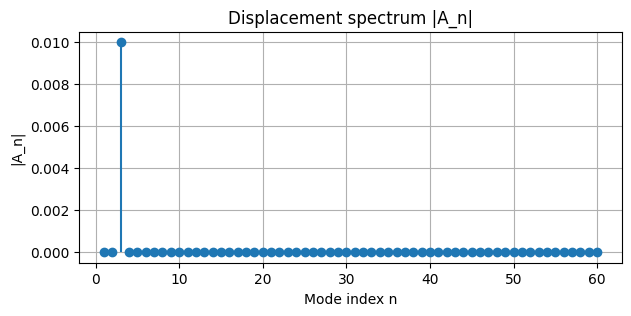

In [6]:
# ================================================================
# Wave equation on a string (fixed ends) - Generic f(x) only
# PDE: y_tt = v^2 y_xx, 0 < x < L, t > 0
# BC:  y(0,t) = 0, y(L,t) = 0
# IC:  y(x,0) = f_generic(x), y_t(x,0) = 0
# ================================================================

import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from IPython.display import HTML, display
import matplotlib

# HTML animation configuration
matplotlib.rcParams["animation.html"] = "jshtml"

# ---------------------- Physical parameters ----------------------
L = 1.0      # string length (m)
T = 100.0    # tension (N)
mu = 0.01    # linear mass density (kg/m)
v = np.sqrt(T / mu)

# ---------------------- Numerical parameters ---------------------
N_MODES = 60        # number of modes
NX = 2000           # spatial grid points
t_max = 0.01         # total simulated time (s)
dt = 0.00002          # time step (s)
N_FRAMES = int(t_max / dt)

# ---------------------- Initial condition f(x) -------------------
# Define here your initial displacement (y(x,0))
# Example: multiple sine peaks (change n_mode or combine sin terms)

def f_generic(x):
    """Initial displacement f(x) with multiple peaks."""
    A1 = 0.01
    A2 = 0.006
    A3 = 0.004
    y1 = A1 * np.sin(3 * np.pi * x / L)
    y2 = A2 * np.sin(5 * np.pi * x / L)
    y3 = A3 * np.sin(7 * np.pi * x / L)
    return y1 + 0*y2 + 0*y3

def g_generic(x):
    """Initial velocity g(x) = 0."""
    return np.zeros_like(x)

# ---------------------- Spatial basis -----------------------------
x = np.linspace(0.0, L, NX)
dx = x[1] - x[0]
n = np.arange(1, N_MODES + 1).reshape(-1, 1)       # (N_MODES,1)
phi = np.sin(n * np.pi * x.reshape(1, -1) / L)     # (N_MODES,NX)
omega = n.flatten() * np.pi * v / L                # (N_MODES,)

# ---------------------- Fourier coefficients ----------------------
f_vals = f_generic(x)
g_vals = g_generic(x)
int_f = np.trapezoid(phi * f_vals.reshape(1, -1), x, axis=1)  # (N_MODES,)
int_g = np.trapezoid(phi * g_vals.reshape(1, -1), x, axis=1)  # (N_MODES,)
An = (2.0 / L) * int_f
Bn = (2.0 / L) * (int_g / omega)

# ---------------------- Reconstruction ----------------------------
def y_xt(t):
    """Compute y(x,t) from modal series."""
    cos_term = An * np.cos(omega * t)
    sin_term = Bn * np.sin(omega * t)
    coeffs = (cos_term + sin_term).reshape(-1, 1)
    y = np.sum(coeffs * phi, axis=0)
    y[0] = 0.0
    y[-1] = 0.0
    return y

# ---------------------- Spectra plots ------------------------------
fig1, ax1 = plt.subplots(figsize=(7, 3))
ax1.stem(np.arange(1, N_MODES + 1), np.abs(An), basefmt=" ")
ax1.set_xlabel("Mode index n")
ax1.set_ylabel("|A_n|")
ax1.set_title("Displacement spectrum |A_n|")
ax1.grid(True)
plt.show()

# ---------------------- Animation ---------------------------------
y0 = y_xt(0.0)
ymax = np.max(np.abs(y0))
if ymax <= 0.0:
    ymax = 1e-3

fig, ax = plt.subplots(figsize=(7, 3))
line, = ax.plot(x, y0, lw=2)
ax.set_xlim(0.0, L)
ax.set_ylim(-1.2 * ymax, 1.2 * ymax)
ax.set_xlabel("x (m)")
ax.set_ylabel("y(x,t) (m)")
ax.set_title("Vibrating string (fixed ends)")

def update(frame):
    t = frame * dt
    y = y_xt(t)
    line.set_data(x, y)
    return (line,)

ani = FuncAnimation(fig, update, frames=N_FRAMES, blit=True, interval=30)
plt.close(fig)
display(HTML(ani.to_jshtml()))
